In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as mp
import seaborn as sn
import re
from bs4 import BeautifulSoup
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
import warnings
warnings.filterwarnings("ignore")
import string

In [2]:
df=pd.read_csv('train.csv')
df.shape

(404290, 6)

In [3]:
df.sample(5)

,id,qid1,qid2,question1,question2,is_duplicate
159938,159938,249574,249575,Do Congressmen have to put their assets in a b...,Do congressmen and senators fly commercial?,0
167940,167940,260240,260241,What are some little known facts about Nikola ...,What are some interesting things that are not ...,1
349205,349205,477847,66104,Who is the best hair transplant doctor in Pune?,Which is the best hair transplant clinic in Pune?,0
387682,387682,119479,7722,What is the best thing to do to start being in...,How do I get involved in open source?,1
157524,157524,25265,45880,How can I hack Facebook?,What are some ways to hack a Facebook account?,1


In [4]:
df=df.sample(30000,random_state=2)

In [5]:

def removal(q):
    
    q = str(q).lower().strip()
    
    # Replace certain special characters with their string equivalents
    q = q.replace('%', ' percent')
    q = q.replace('$', ' dollar ')
    q = q.replace('₹', ' rupee ')
    q = q.replace('€', ' euro ')
    q = q.replace('@', ' at ')
    
    # The pattern '[math]' appears around 900 times in the whole dataset.
    q = q.replace('[math]', '')
    
    # Replacing some numbers with string equivalents (not perfect, can be done better to account for more cases)
    q = q.replace(',000,000,000 ', 'b ')
    q = q.replace(',000,000 ', 'm ')
    q = q.replace(',000 ', 'k ')
    q = re.sub(r'([0-9]+)000000000', r'\1b', q)
    q = re.sub(r'([0-9]+)000000', r'\1m', q)
    q = re.sub(r'([0-9]+)000', r'\1k', q)
    
    # Decontracting words
    # https://en.wikipedia.org/wiki/Wikipedia%3aList_of_English_contractions
    # https://stackoverflow.com/a/19794953
    contractions = { 
    "ain't": "am not",
    "aren't": "are not",
    "can't": "can not",
    "can't've": "can not have",
    "'cause": "because",
    "could've": "could have",
    "couldn't": "could not",
    "couldn't've": "could not have",
    "didn't": "did not",
    "doesn't": "does not",
    "don't": "do not",
    "hadn't": "had not",
    "hadn't've": "had not have",
    "hasn't": "has not",
    "haven't": "have not",
    "he'd": "he would",
    "he'd've": "he would have",
    "he'll": "he will",
    "he'll've": "he will have",
    "he's": "he is",
    "how'd": "how did",
    "how'd'y": "how do you",
    "how'll": "how will",
    "how's": "how is",
    "i'd": "i would",
    "i'd've": "i would have",
    "i'll": "i will",
    "i'll've": "i will have",
    "i'm": "i am",
    "i've": "i have",
    "isn't": "is not",
    "it'd": "it would",
    "it'd've": "it would have",
    "it'll": "it will",
    "it'll've": "it will have",
    "it's": "it is",
    "let's": "let us",
    "ma'am": "madam",
    "mayn't": "may not",
    "might've": "might have",
    "mightn't": "might not",
    "mightn't've": "might not have",
    "must've": "must have",
    "mustn't": "must not",
    "mustn't've": "must not have",
    "needn't": "need not",
    "needn't've": "need not have",
    "o'clock": "of the clock",
    "oughtn't": "ought not",
    "oughtn't've": "ought not have",
    "shan't": "shall not",
    "sha'n't": "shall not",
    "shan't've": "shall not have",
    "she'd": "she would",
    "she'd've": "she would have",
    "she'll": "she will",
    "she'll've": "she will have",
    "she's": "she is",
    "should've": "should have",
    "shouldn't": "should not",
    "shouldn't've": "should not have",
    "so've": "so have",
    "so's": "so as",
    "that'd": "that would",
    "that'd've": "that would have",
    "that's": "that is",
    "there'd": "there would",
    "there'd've": "there would have",
    "there's": "there is",
    "they'd": "they would",
    "they'd've": "they would have",
    "they'll": "they will",
    "they'll've": "they will have",
    "they're": "they are",
    "they've": "they have",
    "to've": "to have",
    "wasn't": "was not",
    "we'd": "we would",
    "we'd've": "we would have",
    "we'll": "we will",
    "we'll've": "we will have",
    "we're": "we are",
    "we've": "we have",
    "weren't": "were not",
    "what'll": "what will",
    "what'll've": "what will have",
    "what're": "what are",
    "what's": "what is",
    "what've": "what have",
    "when's": "when is",
    "when've": "when have",
    "where'd": "where did",
    "where's": "where is",
    "where've": "where have",
    "who'll": "who will",
    "who'll've": "who will have",
    "who's": "who is",
    "who've": "who have",
    "why's": "why is",
    "why've": "why have",
    "will've": "will have",
    "won't": "will not",
    "won't've": "will not have",
    "would've": "would have",
    "wouldn't": "would not",
    "wouldn't've": "would not have",
    "y'all": "you all",
    "y'all'd": "you all would",
    "y'all'd've": "you all would have",
    "y'all're": "you all are",
    "y'all've": "you all have",
    "you'd": "you would",
    "you'd've": "you would have",
    "you'll": "you will",
    "you'll've": "you will have",
    "you're": "you are",
    "you've": "you have"
    }

    q_decontracted = []

    for word in q.split():
        if word in contractions:
            word = contractions[word]

        q_decontracted.append(word)

    q = ' '.join(q_decontracted)
    q = q.replace("'ve", " have")
    q = q.replace("n't", " not")
    q = q.replace("'re", " are")
    q = q.replace("'ll", " will")
    
    # Removing HTML tags
    q = BeautifulSoup(q)
    q = q.get_text()
    
    # Remove punctuations
    pattern = re.compile('\W')
    q = re.sub(pattern, ' ', q).strip()

    
    return q

In [6]:
df['question1']=df['question1'].apply(removal)
df['question2']=df['question2'].apply(removal)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30000 entries, 398782 to 312470
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            30000 non-null  int64 
 1   qid1          30000 non-null  int64 
 2   qid2          30000 non-null  int64 
 3   question1     30000 non-null  object
 4   question2     30000 non-null  object
 5   is_duplicate  30000 non-null  int64 
dtypes: int64(4), object(2)
memory usage: 1.6+ MB


In [8]:
df.duplicated().any()

False

In [9]:
df.isnull().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

In [10]:
df.dropna(inplace=True)

In [11]:
df.isnull().sum()

id              0
qid1            0
qid2            0
question1       0
question2       0
is_duplicate    0
dtype: int64

In [12]:
df['is_duplicate'].value_counts()


0    19013
1    10987
Name: is_duplicate, dtype: int64

In [13]:
(df['is_duplicate'].value_counts()/df['is_duplicate'].count())*100

0    63.376667
1    36.623333
Name: is_duplicate, dtype: float64

<Axes: >

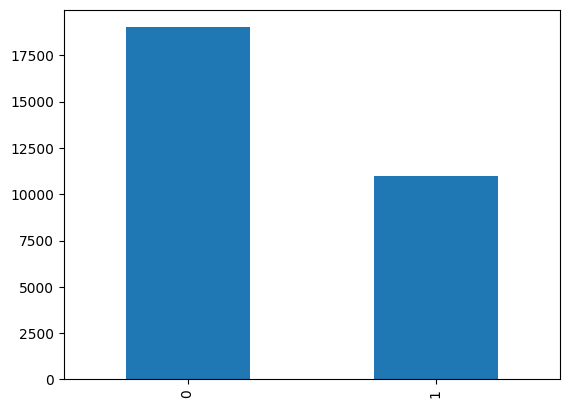

In [14]:
df['is_duplicate'].value_counts().plot(kind='bar')

In [15]:
qid=pd.Series(df['qid1'].tolist()+df['qid2'].tolist())
print("Number of the unique questions",np.unique(qid).shape[0])
x=qid.value_counts()>1
print("The number of questions getting repeated",x[x].shape[0])

Number of the unique questions 55299
The number of questions getting repeated 3480


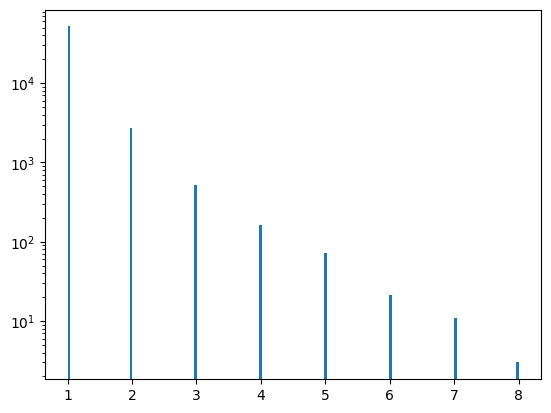

In [16]:
mp.hist(qid.value_counts().values,bins=160)
mp.yscale('log')
mp.show()

In [17]:
df['qlen1']=df['question1'].str.len()
df['qlen2']=df['question2'].str.len()

In [18]:
df.head(5)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49


In [19]:
def word_count(x):
    t=x.split(' ')
    r=len(t)
    return r  

In [20]:
df['q1_words']=df['question1'].apply(word_count)
df['q2_words']=df['question2'].apply(word_count)

In [21]:
df.head(5)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9


In [22]:
df['cm1']=df['question1'].apply(lambda x:" ".join((x.lower().split(' '))))
df['cm2']=df['question2'].apply(lambda x:" ".join((x.lower().split(' '))))


In [23]:
df['cm1']

398782    what is the best marketing automation tool for...
115086     i am poor but i want to invest  what should i do
327711    i am from india and live abroad  i met a guy f...
367788    why do so many people in the u s  hate the sou...
151235                   consequences of bhopal gas tragedy
                                ...                        
243932            what are some good web scraping tutorials
91980     can i apply for internet banking in sbi withou...
266955    how much he laundry detergent do you use in a ...
71112     what is the best way to understand and learn m...
312470    what would the modi led government do in case ...
Name: cm1, Length: 30000, dtype: object

In [24]:
df['cm2']

398782    what is the best marketing automation tool for...
115086    i am quite poor and i want to be very rich  wh...
327711    t i e t to thapar university to thapar univers...
367788    my boyfriend doesnt feel guilty when he hurts ...
151235    what was the reason behind the bhopal gas tragedy
                                ...                        
243932             what are some good web scraping programs
91980     i have internet banking kit of sbi but it is n...
266955    can i use regular dawn dishsoap in my dishwash...
71112          what are some of the best ways to learn math
312470    if pakistan mounts a 26 11 type attack again  ...
Name: cm2, Length: 30000, dtype: object

In [25]:
cmon_word=[]
for i,r in df.iterrows():
    w1=set(r['cm1'].split(' '))
    w2=set(r['cm2'].split(' '))
    common_words = w1.intersection(w2)
    cmon_word.append(len([word for word in common_words if word.strip() != ""]))

df['Cmn_words']=cmon_word


df['Cmn_words']

398782    12
115086     7
327711     3
367788     0
151235     3
          ..
243932     6
91980      4
266955     6
71112      5
312470     7
Name: Cmn_words, Length: 30000, dtype: int64

In [26]:
df['Cmn_words'][398782]

12

In [27]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,cm1,cm2,Cmn_words
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,what is the best marketing automation tool for...,what is the best marketing automation tool for...,12
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,7
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,3


In [28]:
t_wrd=[]
for i,r in df.iterrows():
        w1=set([word for word in r['cm1'].split(' ') if word.strip() != ""])
        w2=set([word for word in r['cm2'].split(' ') if word.strip() != ""])
        tl_wrd=(len(w1)+len(w2))
        t_wrd.append(tl_wrd)
        
        
        

In [29]:
df['wrd_total']=t_wrd

In [30]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,cm1,cm2,Cmn_words,wrd_total
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,what is the best marketing automation tool for...,what is the best marketing automation tool for...,12,26
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,7,22
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,3,36


In [31]:
df['shr_wrd'] = df.apply(lambda row: row['Cmn_words'] / row['wrd_total'] if row['wrd_total'] != 0 else 0, axis=1)


In [32]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,cm1,cm2,Cmn_words,wrd_total,shr_wrd
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,what is the best marketing automation tool for...,what is the best marketing automation tool for...,12,26,0.461538
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,7,22,0.318182
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,3,36,0.083333


minimum characters:  2
max characters:  397
average num of characters:  58.74686666666667


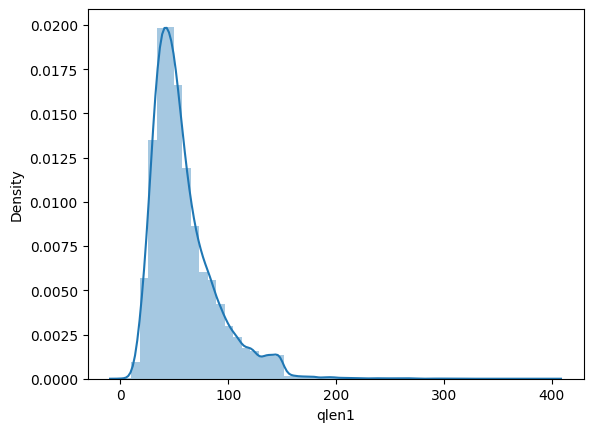

In [33]:
#Analysis of feature
sn.distplot(df['qlen1'])
print('minimum characters: ',df['qlen1'].min())
print('max characters: ',df['qlen1'].max())
print('average num of characters: ',df['qlen1'].mean())

minimum characters:  0
max characters:  1162
average num of characters:  59.346833333333336


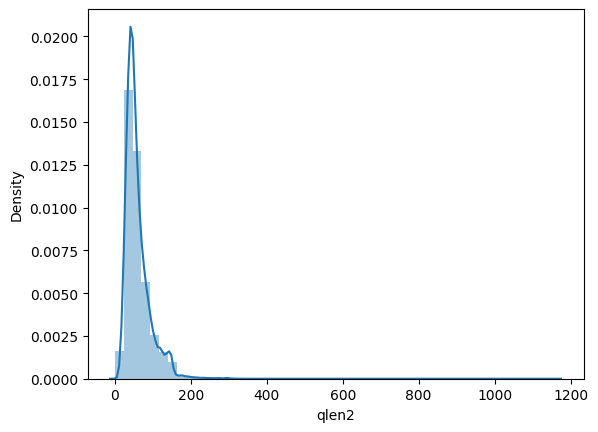

In [34]:
sn.distplot(df['qlen2'])
print('minimum characters: ',df['qlen2'].min())
print('max characters: ',df['qlen2'].max())
print('average num of characters: ',df['qlen2'].mean())

minimum characters:  1
max characters:  79
average num of characters:  11.552566666666667


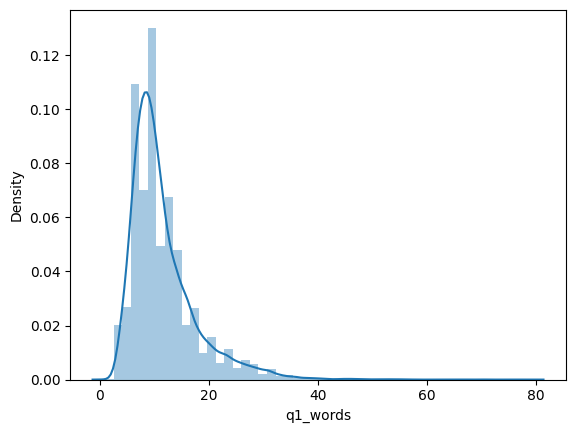

In [35]:
sn.distplot(df['q1_words'])
print('minimum characters: ',df['q1_words'].min())
print('max characters: ',df['q1_words'].max())
print('average num of characters: ',df['q1_words'].mean())

minimum characters:  1
max characters:  270
average num of characters:  11.842933333333333


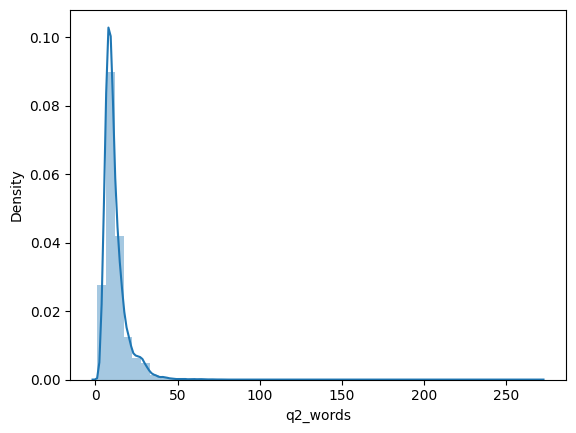

In [36]:
sn.distplot(df['q2_words'])
print('minimum characters: ',df['q2_words'].min())
print('max characters: ',df['q2_words'].max())
print('average num of characters: ',df['q2_words'].mean())

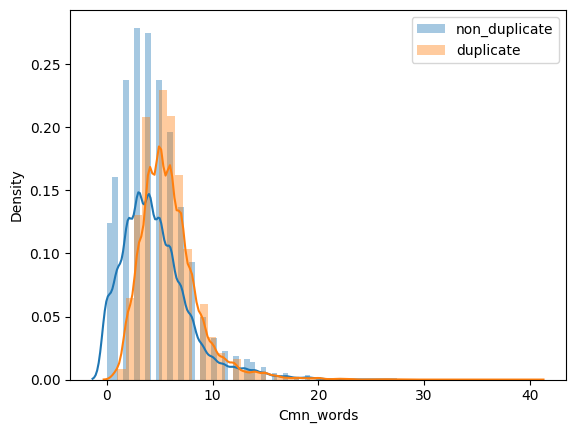

In [37]:
#common_word analysis
sn.distplot(df[df['is_duplicate']==0]['Cmn_words'],label='non_duplicate',kde=True)
sn.distplot(df[df['is_duplicate']==1]['Cmn_words'],label='duplicate',kde=True)
mp.legend()
mp.show()

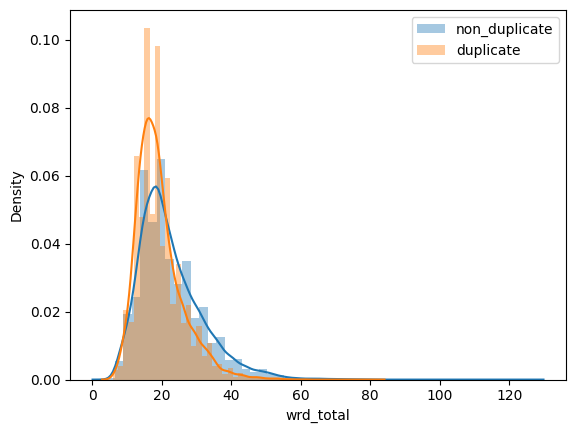

In [38]:
#Total words
sn.distplot(df[df['is_duplicate']==0]['wrd_total'],label='non_duplicate',kde=True)
sn.distplot(df[df['is_duplicate']==1]['wrd_total'],label='duplicate',kde=True)
mp.legend()
mp.show()

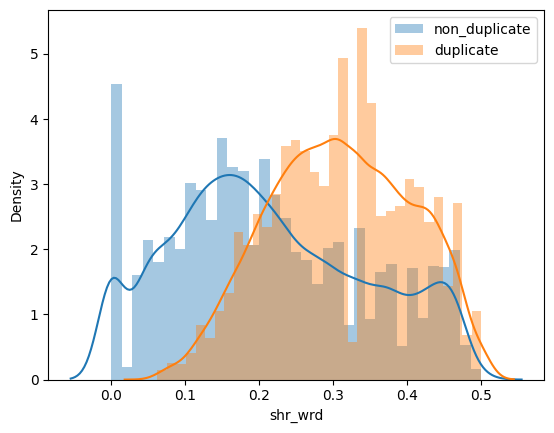

In [39]:
#Shared Words
sn.distplot(df[df['is_duplicate']==0]['shr_wrd'],label='non_duplicate',kde=True)
sn.distplot(df[df['is_duplicate']==1]['shr_wrd'],label='duplicate',kde=True)
mp.legend()
mp.show()

In [40]:
# df=df.sample(30000)

In [41]:
# df.shape

In [42]:
# df.keys()

In [43]:
# q_df=df[['question1','question2']]

In [44]:
# q_df.head(3)

In [45]:
# rdf=df[['is_duplicate','qlen1','qlen2', 'q1_words','q2_words', 'Cmn_words', 'wrd_total', 'shr_wrd']]

In [46]:
# rdf

In [47]:
# from sklearn.feature_extraction.text import CountVectorizer
# quest=list(q_df['question1'])+list(q_df['question2'])
# cv=CountVectorizer(max_features=3000)
# q1_arr,q2_arr=np.vsplit(cv.fit_transform(quest).toarray(),2)

In [48]:
# tdf1=pd.DataFrame(q1_arr,index=q_df.index)
# tdf2=pd.DataFrame(q2_arr,index=q_df.index)
# fdf=pd.concat([rdf,tdf1,tdf2],axis=1)
# fdf.head(3)

In [49]:
# fdf.shape

In [50]:
# x=fdf.drop('is_duplicate',axis=1)
# y=fdf['is_duplicate']

In [51]:
# from sklearn.model_selection import train_test_split
# x_train,x_test,y_train,y_test=train_test_split(x.values,y.values,test_size=0.2,random_state=42)

In [52]:

# rfc=RandomForestClassifier()
# rfc.fit(x_train,y_train)
# ypr=rfc.predict(x_test)
# accuracy_score(y_test,ypr)
# 0.7526666666666667

In [53]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,cm1,cm2,Cmn_words,wrd_total,shr_wrd
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,what is the best marketing automation tool for...,what is the best marketing automation tool for...,12,26,0.461538
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,7,22,0.318182
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,3,36,0.083333


In [54]:
# t=[]
# for i in range(len(df['qlen1'])):
#     for j in range(len(df['qlen2'])):
#         if df['qlen1'][i]>df['qlen2'][j]:
#             m=df['qlen2'][j]
#         elif df['qlen1'][i]<df['qlen2'][j]:
#             m=df['qlen1'][i]  
#         t.append(m)  

# import pandas as pd

# # Assuming df is your DataFrame

# # Calculate the minimum between 'qlen1' and 'qlen2' for each row
# df['t'] = df[['qlen1', 'qlen2']].min(axis=1)

# print(df)

t = []
for index, row in df.iterrows():
    if row['q1_words'] > row['q2_words']:
        m = row['q2_words']
    elif row['q1_words'] < row['q2_words']:
        m = row['q1_words']
    elif row['q1_words'] == row['q2_words']:
        m = row['q2_words']    
    t.append(m)

df['wrd_min']=t        


In [55]:
df['cwc_min'] = df.apply(lambda row: row['Cmn_words'] / row['wrd_min'] if row['wrd_min'] != 0 else 0, axis=1)


In [56]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,cm1,cm2,Cmn_words,wrd_total,shr_wrd,wrd_min,cwc_min
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,what is the best marketing automation tool for...,what is the best marketing automation tool for...,12,26,0.461538,13,0.923077
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,7,22,0.318182,13,0.538462
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,3,36,0.083333,21,0.142857


In [57]:
t = []
for index, row in df.iterrows():
    if row['q1_words'] < row['q2_words']:
        m = row['q2_words']
    elif row['q1_words'] > row['q2_words']:
        m = row['q1_words']
    elif row['q1_words'] == row['q2_words']:
        m = row['q1_words']    
    t.append(m)

df['wrd_max']=t        

In [58]:
df['cwc_max'] = df.apply(lambda row: row['Cmn_words'] / row['wrd_max'] if row['wrd_max'] != 0 else 0, axis=1)


In [59]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,cm1,cm2,Cmn_words,wrd_total,shr_wrd,wrd_min,cwc_min,wrd_max,cwc_max
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,what is the best marketing automation tool for...,what is the best marketing automation tool for...,12,26,0.461538,13,0.923077,13,0.923077
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,7,22,0.318182,13,0.538462,16,0.437500
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,3,36,0.083333,21,0.142857,28,0.107143


In [60]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
def sw(x):
    t=[]
    for i in x.split(' '):
        if i in stop_words:
            t.append(i)
    return len(set(t))    

df['st1']=df['question1'].apply(sw)
df['st2']=df['question2'].apply(sw)


In [61]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,cm2,Cmn_words,wrd_total,shr_wrd,wrd_min,cwc_min,wrd_max,cwc_max,st1,st2
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,what is the best marketing automation tool for...,12,26,0.461538,13,0.923077,13,0.923077,5,5
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,i am quite poor and i want to be very rich wh...,7,22,0.318182,13,0.538462,16,0.437500,7,8
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,t i e t to thapar university to thapar univers...,3,36,0.083333,21,0.142857,28,0.107143,11,7


In [62]:
t=[]
for i,row in df.iterrows():
    if row['st1']>row['st2']:
          m = row['st2']
    elif row['st1']<row['st2']:
          m = row['st1']
    elif row['st1']==row['st2']:
         m=row['st1']     
    t.append(m)

df['sw_min']=t          

In [63]:
t=[]
for i,row in df.iterrows():
    if row['st1']<row['st2']:
          m = row['st2']
    elif row['st1']>row['st2']:
          m = row['st1']
    elif row['st1']==row['st2']:
          m=row['st2'] 

    t.append(m)

df['sw_max']=t 

In [64]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
def swp(x):
    t=[]
    for i in x.split(' '):
        if i in stop_words:
            t.append(i)
    return " ".join(list(t)) 

df['stw1']=df['question1'].apply(swp)
df['stw2']=df['question2'].apply(swp)



In [65]:
val = []

for i, r in df.iterrows():
    words1 = set(r['stw1'].split(' '))
    words2 = set(r['stw2'].split(' '))
    count = len(words1.intersection(words2))
    val.append(count)
df['cm_stw']=val
        

In [66]:
df.head(5)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,cwc_min,wrd_max,cwc_max,st1,st2,sw_min,sw_max,stw1,stw2,cm_stw
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,0.923077,13,0.923077,5,5,5,5,what is the for and,what is the for and,5
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,0.538462,16,0.437500,7,8,7,8,i am but i to what should i do,i am and i to be very what do i do,5
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,0.142857,28,0.107143,11,7,7,11,i am from and i a from in a i to him how do i ...,t i t to to of and can this,3
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,0.000000,32,0.000000,6,8,6,8,why do so in the s the,my when he me he when he was me how he a when ...,0
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,0.600000,9,0.333333,1,3,1,3,of,what was the the,0


In [67]:
df['csc_min'] = df.apply(lambda row: row['cm_stw'] / row['sw_min'] if row['sw_min'] != 0 else 0, axis=1)
df['csc_max'] = df.apply(lambda row: row['cm_stw'] / row['sw_max'] if row['sw_max'] != 0 else 0, axis=1)


In [68]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,cwc_max,st1,st2,sw_min,sw_max,stw1,stw2,cm_stw,csc_min,csc_max
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,0.923077,5,5,5,5,what is the for and,what is the for and,5,1.000000,1.000000
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,0.437500,7,8,7,8,i am but i to what should i do,i am and i to be very what do i do,5,0.714286,0.625000
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,0.107143,11,7,7,11,i am from and i a from in a i to him how do i ...,t i t to to of and can this,3,0.428571,0.272727


In [69]:
c_tok=[]
w1_tok=[]
w2_tok=[]
for i,r in df.iterrows():
    w1=set(r['cm1'].split(' '))
    w1_tok.append(len(w1))

    w2=set(r['cm2'].split(' '))
    w2_tok.append(len(w2))

    count =w1.intersection(w2)
    c_tok.append(len(count))

df['cmn_token'] = c_tok
df['w1_tok'] = w1_tok
df['w2_tok'] = w2_tok




In [70]:
df.head(5)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,sw_min,sw_max,stw1,stw2,cm_stw,csc_min,csc_max,cmn_token,w1_tok,w2_tok
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,5,5,what is the for and,what is the for and,5,1.000000,1.000000,12,13,13
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,7,8,i am but i to what should i do,i am and i to be very what do i do,5,0.714286,0.625000,8,11,13
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,7,11,i am from and i a from in a i to him how do i ...,t i t to to of and can this,3,0.428571,0.272727,4,21,17
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,6,8,why do so in the s the,my when he me he when he was me how he a when ...,0,0.000000,0.000000,1,13,21
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,1,3,of,what was the the,0,0.000000,0.000000,3,5,8


In [71]:

t=[]
for i,row in df.iterrows():
    if row['w1_tok']>row['w2_tok']:
          m = row['w2_tok']
    elif row['w1_tok']<row['w2_tok']:
          m = row['w1_tok']
    elif row['w1_tok']==row['w2_tok']:
         m=row['w1_tok']     
    t.append(m)

df['qtok_min']=t         


In [72]:
t=[]
for i,row in df.iterrows():
    if row['w1_tok']>row['w2_tok']:
          m = row['w1_tok']
    elif row['w1_tok']<row['w2_tok']:
          m = row['w2_tok']
    elif row['w1_tok']==row['w2_tok']:
         m=row['w1_tok']     
    t.append(m)

df['qtok_max']=t  

In [73]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,stw1,stw2,cm_stw,csc_min,csc_max,cmn_token,w1_tok,w2_tok,qtok_min,qtok_max
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,what is the for and,what is the for and,5,1.000000,1.000000,12,13,13,13,13
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,i am but i to what should i do,i am and i to be very what do i do,5,0.714286,0.625000,8,11,13,11,13
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,i am from and i a from in a i to him how do i ...,t i t to to of and can this,3,0.428571,0.272727,4,21,17,17,21


In [74]:
df['ctc_min']=df.apply(lambda row: row['cmn_token'] / row['qtok_min'] if row['qtok_min'] != 0 else 0, axis=1)
df['ctc_max']=df.apply(lambda row: row['cmn_token'] / row['qtok_max'] if row['qtok_max'] != 0 else 0, axis=1)

In [75]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,cm_stw,csc_min,csc_max,cmn_token,w1_tok,w2_tok,qtok_min,qtok_max,ctc_min,ctc_max
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,5,1.000000,1.000000,12,13,13,13,13,0.923077,0.923077
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,5,0.714286,0.625000,8,11,13,11,13,0.727273,0.615385
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,3,0.428571,0.272727,4,21,17,17,21,0.235294,0.190476


In [76]:
t_val = []
for i, row in df.iterrows():
    w1 = row['question1'].split(' ')
    w2 = row['question2'].split(' ')
    
    if w1 and w2:
        if w1[0] == w2[0]:
            t_val.append(1)
        else:
            t_val.append(0)
    else:
        t_val.append(0)

df['Strt_eql'] = t_val


In [77]:
df['Strt_eql'].value_counts()

1    15453
0    14547
Name: Strt_eql, dtype: int64

<Axes: xlabel='Strt_eql', ylabel='count'>

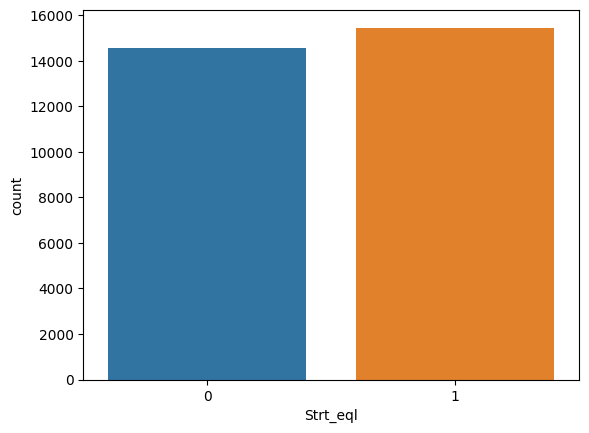

In [78]:
sn.countplot(data=df,x='Strt_eql')

In [79]:
t_val = []
for i, row in df.iterrows():
    w1 = row['question1'].split(' ')
    w2 = row['question2'].split(' ')
    
    if w1 and w2:
        if w1[-1] == w2[-1]:
            t_val.append(1)
        else:
            t_val.append(0)
    else:
        t_val.append(0)

df['lst_eql'] = t_val

In [80]:
df['lst_eql'].value_counts()

0    20441
1     9559
Name: lst_eql, dtype: int64

<Axes: xlabel='lst_eql', ylabel='count'>

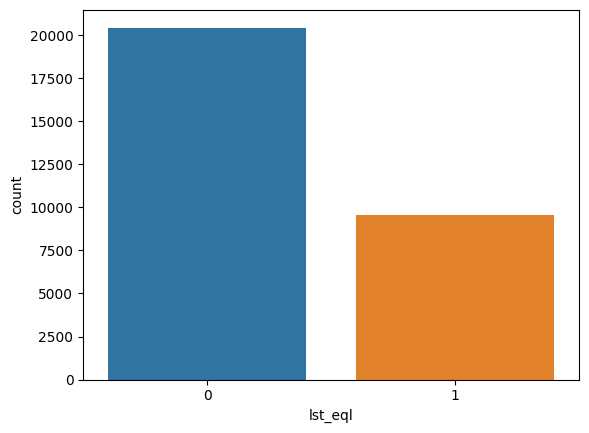

In [81]:
sn.countplot(data=df,x='lst_eql')

In [82]:
df.head(5)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,csc_max,cmn_token,w1_tok,w2_tok,qtok_min,qtok_max,ctc_min,ctc_max,Strt_eql,lst_eql
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,1.000000,12,13,13,13,13,0.923077,0.923077,1,1
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,0.625000,8,11,13,11,13,0.727273,0.615385,1,1
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,0.272727,4,21,17,17,21,0.235294,0.190476,0,0
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,0.000000,1,13,21,13,21,0.076923,0.047619,0,0
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,0.000000,3,5,8,5,8,0.600000,0.375000,0,1


In [83]:
#length based Feature

In [84]:
df['mean_len']=(df['q1_words']+df['q2_words'])/2 if (row['q1_words'] + row['q2_words']) != 0 else 0

In [85]:
df['abs_len_diff']=abs(df['q1_words']-df['q2_words'])

In [86]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,w1_tok,w2_tok,qtok_min,qtok_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,13,13,13,13,0.923077,0.923077,1,1,13.0,0
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,11,13,11,13,0.727273,0.615385,1,1,14.5,3
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,21,17,17,21,0.235294,0.190476,0,0,24.5,7


In [87]:
from difflib import SequenceMatcher
l_str=[]
for i,rw in df.iterrows():
   seq_match=SequenceMatcher(None,rw['question1'],rw['question2'])
   match = seq_match.find_longest_match(0, len(rw['question1']), 0, len(rw['question2']))
   longest_common_substring = rw['question1'][match.a:match.a + match.size]
   l_str.append(longest_common_substring)

df['l_string']=l_str

In [88]:
df['l_string']=df['l_string'].apply(lambda x:len(x.split(' ')))

In [89]:
df.head(5)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,w2_tok,qtok_min,qtok_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff,l_string
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,13,13,13,0.923077,0.923077,1,1,13.0,0,12
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,13,11,13,0.727273,0.615385,1,1,14.5,3,5
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,17,17,21,0.235294,0.190476,0,0,24.5,7,3
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,...,21,13,21,0.076923,0.047619,0,0,23.0,18,2
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,...,8,5,8,0.600000,0.375000,0,1,7.0,4,4


In [90]:
df['lst_ratio'] = df.apply(lambda row: 2 * row['l_string'] / (row['q1_words'] + row['q2_words']) if (row['q1_words'] + row['q2_words']) != 0 else 0, axis=1)



In [91]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,qtok_min,qtok_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff,l_string,lst_ratio
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,13,13,0.923077,0.923077,1,1,13.0,0,12,0.923077
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,11,13,0.727273,0.615385,1,1,14.5,3,5,0.344828
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,17,21,0.235294,0.190476,0,0,24.5,7,3,0.122449


In [92]:
#Fuzzy logix

In [93]:
from fuzzywuzzy import fuzz
f_ratio=[]
for i,r in df.iterrows():
    f_ratio.append(fuzz.partial_ratio(r['question1'],r['question2']))
    
df['fprtl_rto']=f_ratio    

In [94]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,...,qtok_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff,l_string,lst_ratio,fprtl_rto
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,...,13,0.923077,0.923077,1,1,13.0,0,12,0.923077,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,...,13,0.727273,0.615385,1,1,14.5,3,5,0.344828,67
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,...,21,0.235294,0.190476,0,0,24.5,7,3,0.122449,29


In [95]:
from fuzzywuzzy import fuzz
f_ratio=[]
for i,r in df.iterrows():
    f_ratio.append(fuzz.token_sort_ratio(r['question1'],r['question2']))
    
df['tknsrt_rto']=f_ratio    

In [96]:
from fuzzywuzzy import fuzz
f_ratio=[]
for i,r in df.iterrows():
    f_ratio.append(fuzz.token_set_ratio(r['question1'],r['question2']))
    
df['tknset_rto']=f_ratio  

In [97]:
from fuzzywuzzy import fuzz
f_ratio=[]
for i,r in df.iterrows():
    f_ratio.append(fuzz.ratio(r['question1'],r['question2']))
    
df['fzz_rto']=f_ratio  

In [98]:
pd.set_option('display.max_columns', None) 
df.head()

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,cm1,cm2,Cmn_words,wrd_total,shr_wrd,wrd_min,cwc_min,wrd_max,cwc_max,st1,st2,sw_min,sw_max,stw1,stw2,cm_stw,csc_min,csc_max,cmn_token,w1_tok,w2_tok,qtok_min,qtok_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff,l_string,lst_ratio,fprtl_rto,tknsrt_rto,tknset_rto,fzz_rto
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,what is the best marketing automation tool for...,what is the best marketing automation tool for...,12,26,0.461538,13,0.923077,13,0.923077,5,5,5,5,what is the for and,what is the for and,5,1.000000,1.000000,12,13,13,13,13,0.923077,0.923077,1,1,13.0,0,12,0.923077,99,99,99,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,7,22,0.318182,13,0.538462,16,0.437500,7,8,7,8,i am but i to what should i do,i am and i to be very what do i do,5,0.714286,0.625000,8,11,13,11,13,0.727273,0.615385,1,1,14.5,3,5,0.344828,67,65,74,69
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,3,36,0.083333,21,0.142857,28,0.107143,11,7,7,11,i am from and i a from in a i to him how do i ...,t i t to to of and can this,3,0.428571,0.272727,4,21,17,17,21,0.235294,0.190476,0,0,24.5,7,3,0.122449,29,34,43,26
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,32,0.000000,14,0.000000,32,0.000000,6,8,6,8,why do so in the s the,my when he me he when he was me how he a when ...,0,0.000000,0.000000,1,13,21,13,21,0.076923,0.047619,0,0,23.0,18,2,0.086957,41,23,30,29
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,3,13,0.230769,5,0.600000,9,0.333333,1,3,1,3,of,what was the the,0,0.000000,0.000000,3,5,8,5,8,0.600000,0.375000,0,1,7.0,4,4,0.571429,70,48,69,55


In [99]:
df.columns

Index(['id', 'qid1', 'qid2', 'question1', 'question2', 'is_duplicate', 'qlen1',
       'qlen2', 'q1_words', 'q2_words', 'cm1', 'cm2', 'Cmn_words', 'wrd_total',
       'shr_wrd', 'wrd_min', 'cwc_min', 'wrd_max', 'cwc_max', 'st1', 'st2',
       'sw_min', 'sw_max', 'stw1', 'stw2', 'cm_stw', 'csc_min', 'csc_max',
       'cmn_token', 'w1_tok', 'w2_tok', 'qtok_min', 'qtok_max', 'ctc_min',
       'ctc_max', 'Strt_eql', 'lst_eql', 'mean_len', 'abs_len_diff',
       'l_string', 'lst_ratio', 'fprtl_rto', 'tknsrt_rto', 'tknset_rto',
       'fzz_rto'],
      dtype='object')

In [100]:
df.drop([ 'cm1', 'cm2',
        'wrd_min', 'wrd_max', 'st1', 'st2',
       'sw_min', 'sw_max', 'stw1', 'stw2', 'cm_stw',
       'cmn_token', 'w1_tok', 'w2_tok', 'qtok_min', 'qtok_max',
       'l_string'],axis=1,inplace=True)

In [101]:
df.head(5)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,Cmn_words,wrd_total,shr_wrd,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff,lst_ratio,fprtl_rto,tknsrt_rto,tknset_rto,fzz_rto
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12,26,0.461538,0.923077,0.923077,1.000000,1.000000,0.923077,0.923077,1,1,13.0,0,0.923077,99,99,99,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,7,22,0.318182,0.538462,0.437500,0.714286,0.625000,0.727273,0.615385,1,1,14.5,3,0.344828,67,65,74,69
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,3,36,0.083333,0.142857,0.107143,0.428571,0.272727,0.235294,0.190476,0,0,24.5,7,0.122449,29,34,43,26
367788,367788,498109,491396,why do so many people in the u s hate the sou...,my boyfriend doesnt feel guilty when he hurts ...,0,58,145,14,32,0,32,0.000000,0.000000,0.000000,0.000000,0.000000,0.076923,0.047619,0,0,23.0,18,0.086957,41,23,30,29
151235,151235,237843,50930,consequences of bhopal gas tragedy,what was the reason behind the bhopal gas tragedy,0,34,49,5,9,3,13,0.230769,0.600000,0.333333,0.000000,0.000000,0.600000,0.375000,0,1,7.0,4,0.571429,70,48,69,55


In [102]:
#Pefrorming EDA

<Axes: >

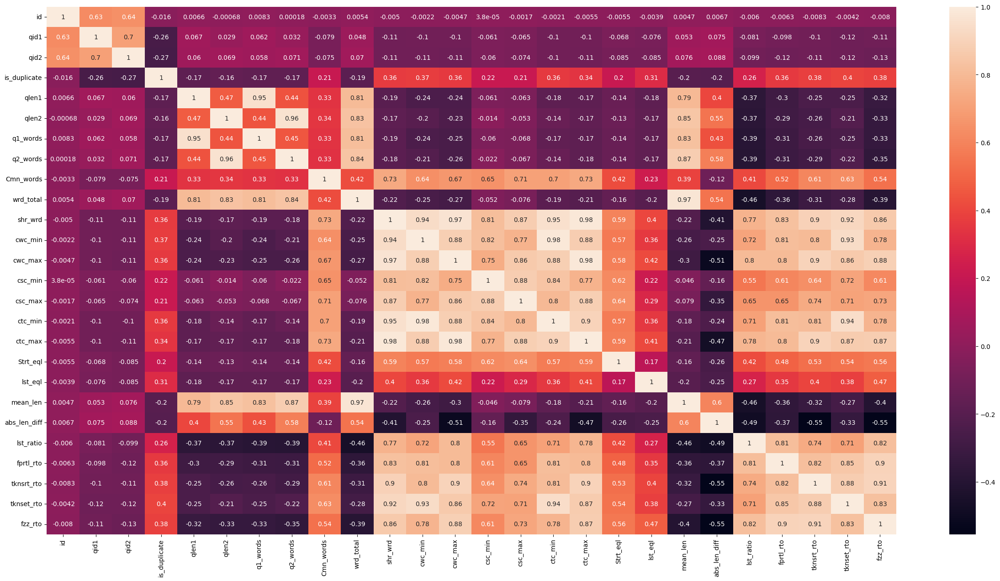

In [103]:
mp.figure(figsize=(30,15))
sn.heatmap(df.corr(),annot=True)

In [104]:
df.corr()['is_duplicate']

id             -0.015527
qid1           -0.257412
qid2           -0.266332
is_duplicate    1.000000
qlen1          -0.173274
qlen2          -0.158667
q1_words       -0.168336
q2_words       -0.168052
Cmn_words       0.206970
wrd_total      -0.186585
shr_wrd         0.364557
cwc_min         0.372198
cwc_max         0.359980
csc_min         0.215130
csc_max         0.212565
ctc_min         0.358377
ctc_max         0.343383
Strt_eql        0.204836
lst_eql         0.307402
mean_len       -0.197152
abs_len_diff   -0.204125
lst_ratio       0.261402
fprtl_rto       0.357904
tknsrt_rto      0.378383
tknset_rto      0.397651
fzz_rto         0.381282
Name: is_duplicate, dtype: float64

In [105]:
df.columns

Index(['id', 'qid1', 'qid2', 'question1', 'question2', 'is_duplicate', 'qlen1',
       'qlen2', 'q1_words', 'q2_words', 'Cmn_words', 'wrd_total', 'shr_wrd',
       'cwc_min', 'cwc_max', 'csc_min', 'csc_max', 'ctc_min', 'ctc_max',
       'Strt_eql', 'lst_eql', 'mean_len', 'abs_len_diff', 'lst_ratio',
       'fprtl_rto', 'tknsrt_rto', 'tknset_rto', 'fzz_rto'],
      dtype='object')

In [106]:
# High Positive Correlation (closer to 1):

# cwc_min
# cwc_max
# csc_min
# csc_max
# ctc_min
# ctc_max
# lst_eql
# fprtl_rto
# tknsrt_rto
# tknset_rto
# fzz_rto
# Moderate Positive Correlation:

# Cmn_words
# Strt_eql
# lst_ratio
# Weak Positive Correlation:

# qid1
# qid2
# qlen1
# qlen2
# q1_words
# q2_words
# shr_wrd
# Weak Negative Correlation:

# qlen1
# qlen2
# q1_words
# q2_words
# wrd_total
# mean_len
# abs_len_diff
# Low Correlation:

# id
# Keep in mind that the assessment of correlation strength depends on the context of your data and the specific goals of your analysis. You should consider both the magnitude of the correlation coefficient and the domain knowledge to interpret the correlations accurately.






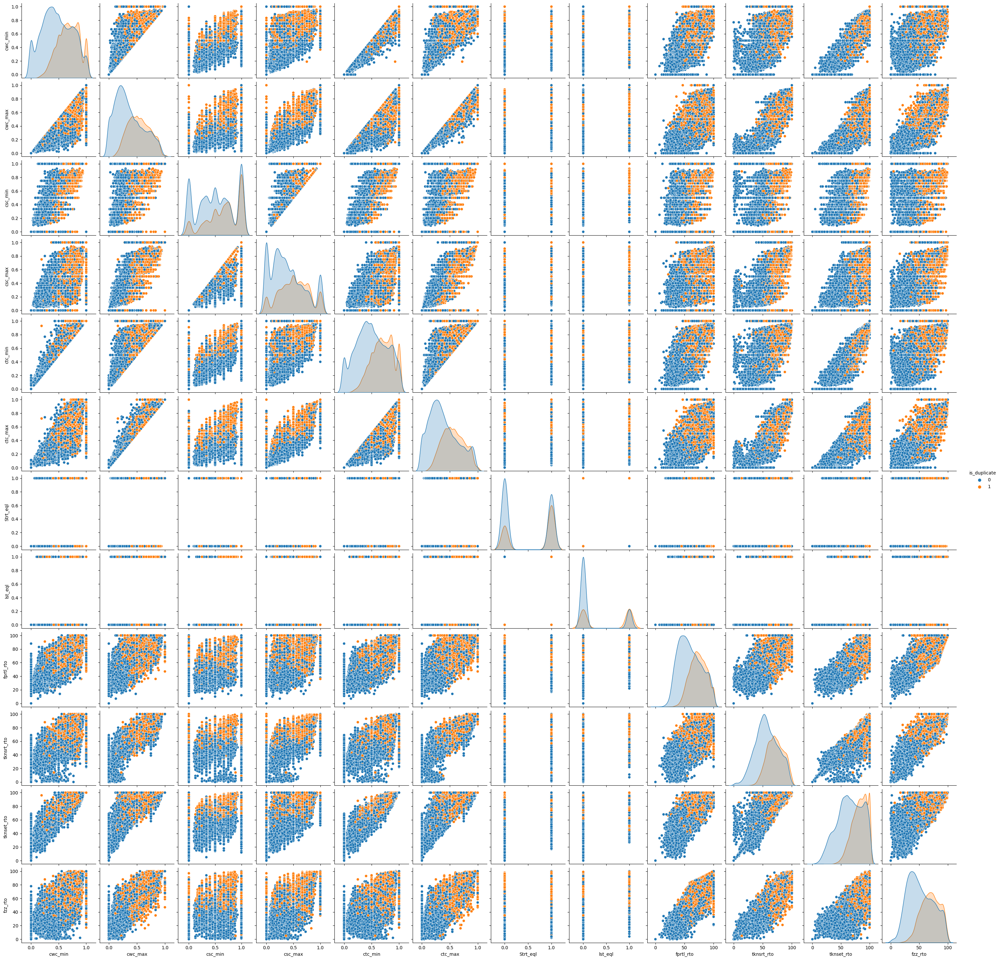

In [107]:
#Pairplot  of highly  and mid correlated feature
sn.pairplot(df[['cwc_min', 'cwc_max', 'csc_min', 'csc_max', 'ctc_min', 'ctc_max','Strt_eql', 'lst_eql','fprtl_rto', 'tknsrt_rto', 'tknset_rto', 'fzz_rto','is_duplicate']],hue='is_duplicate')

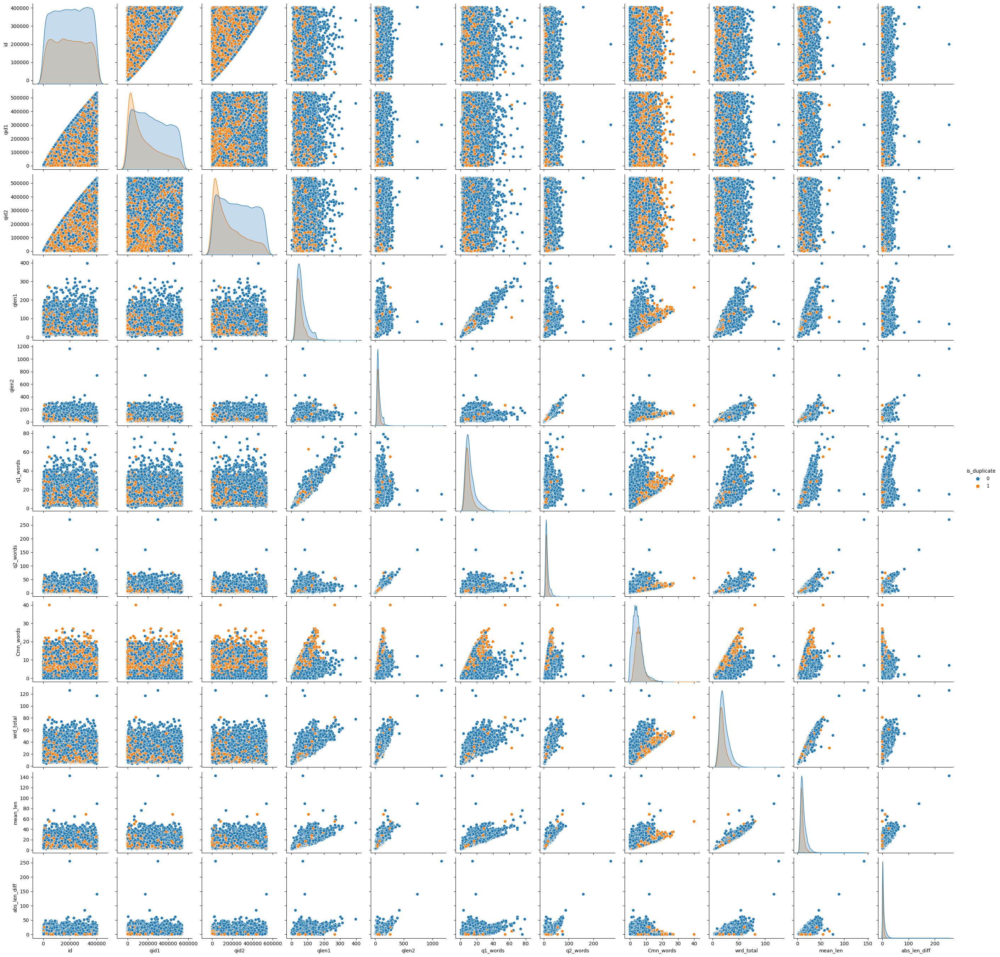

In [108]:


selected_columns = ['id', 'qid1', 'qid2', 'is_duplicate', 'qlen1', 'qlen2', 'q1_words', 'q2_words', 'Cmn_words', 'wrd_total', 'mean_len', 'abs_len_diff']

sn.pairplot(df[selected_columns], hue='is_duplicate')



In [109]:
#applying Dimension Reductionality for more better analysis..
from sklearn.preprocessing import MinMaxScaler
ms=MinMaxScaler()
selected_columns = ['cwc_min', 'cwc_max', 'csc_min', 'csc_max', 'ctc_min', 'ctc_max',
                    'Strt_eql', 'lst_eql', 'mean_len', 'abs_len_diff', 'lst_ratio',
                    'fprtl_rto', 'tknsrt_rto', 'tknset_rto', 'fzz_rto']
x=ms.fit_transform(df[selected_columns])
y=df['is_duplicate'].values

In [110]:
from sklearn.manifold import TSNE
tsne2d=TSNE(
    n_components=2,init='random',#pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(x)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 30000 samples in 0.368s...
[t-SNE] Computed neighbors for 30000 samples in 6.048s...
[t-SNE] Computed conditional probabilities for sample 1000 / 30000
[t-SNE] Computed conditional probabilities for sample 2000 / 30000
[t-SNE] Computed conditional probabilities for sample 3000 / 30000
[t-SNE] Computed conditional probabilities for sample 4000 / 30000
[t-SNE] Computed conditional probabilities for sample 5000 / 30000
[t-SNE] Computed conditional probabilities for sample 6000 / 30000
[t-SNE] Computed conditional probabilities for sample 7000 / 30000
[t-SNE] Computed conditional probabilities for sample 8000 / 30000
[t-SNE] Computed conditional probabilities for sample 9000 / 30000
[t-SNE] Computed conditional probabilities for sample 10000 / 30000
[t-SNE] Computed conditional probabilities for sample 11000 / 30000
[t-SNE] Computed conditional probabilities for sample 12000 / 30000
[t-SNE] Computed conditional probabilities for sam

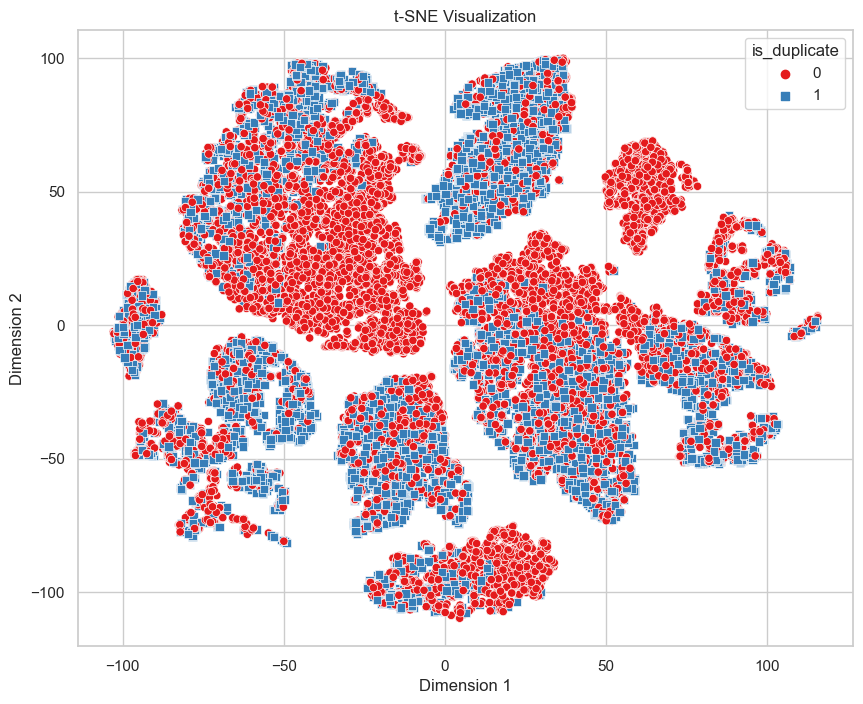

In [111]:
tsne_df = pd.DataFrame(data=tsne2d, columns=['Dimension 1', 'Dimension 2'])
tsne_df['is_duplicate'] = y
sn.set(style='whitegrid')
mp.figure(figsize=(10, 8))
sn.scatterplot(data=tsne_df, x='Dimension 1', y='Dimension 2', hue='is_duplicate', palette='Set1',
                style='is_duplicate', markers=["o", "s"])

mp.title('t-SNE Visualization')
mp.legend(title='is_duplicate')

In [112]:
df.head(3)

,id,qid1,qid2,question1,question2,is_duplicate,qlen1,qlen2,q1_words,q2_words,Cmn_words,wrd_total,shr_wrd,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff,lst_ratio,fprtl_rto,tknsrt_rto,tknset_rto,fzz_rto
398782,398782,496695,532029,what is the best marketing automation tool for...,what is the best marketing automation tool for...,1,75,76,13,13,12,26,0.461538,0.923077,0.923077,1.000000,1.000000,0.923077,0.923077,1,1,13.0,0,0.923077,99,99,99,99
115086,115086,187729,187730,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...,0,48,56,13,16,7,22,0.318182,0.538462,0.437500,0.714286,0.625000,0.727273,0.615385,1,1,14.5,3,0.344828,67,65,74,69
327711,327711,454161,454162,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...,0,104,119,28,21,3,36,0.083333,0.142857,0.107143,0.428571,0.272727,0.235294,0.190476,0,0,24.5,7,0.122449,29,34,43,26


In [113]:
q_df=df[['question1','question2']]

In [114]:
q_df.head(3)

,question1,question2
398782,what is the best marketing automation tool for...,what is the best marketing automation tool for...
115086,i am poor but i want to invest what should i do,i am quite poor and i want to be very rich wh...
327711,i am from india and live abroad i met a guy f...,t i e t to thapar university to thapar univers...


In [115]:
ndf=df.drop(['id','qid1','qid2','question1','question2'],axis=1)

In [116]:
ndf.head(3)

,is_duplicate,qlen1,qlen2,q1_words,q2_words,Cmn_words,wrd_total,shr_wrd,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,Strt_eql,lst_eql,mean_len,abs_len_diff,lst_ratio,fprtl_rto,tknsrt_rto,tknset_rto,fzz_rto
398782,1,75,76,13,13,12,26,0.461538,0.923077,0.923077,1.000000,1.000000,0.923077,0.923077,1,1,13.0,0,0.923077,99,99,99,99
115086,0,48,56,13,16,7,22,0.318182,0.538462,0.437500,0.714286,0.625000,0.727273,0.615385,1,1,14.5,3,0.344828,67,65,74,69
327711,0,104,119,28,21,3,36,0.083333,0.142857,0.107143,0.428571,0.272727,0.235294,0.190476,0,0,24.5,7,0.122449,29,34,43,26


In [117]:
from sklearn.feature_extraction.text import CountVectorizer
qustn=list(q_df['question1'])+list(q_df['question2'])
cv=CountVectorizer(max_features=3000) 
qst1,qst2=np.vsplit(cv.fit_transform(qustn).toarray(),2)

In [118]:
td1=pd.DataFrame(qst1,index=q_df.index)
td2=pd.DataFrame(qst2,index=q_df.index)
td=pd.concat([td1,td2],axis=1)

In [119]:
df=pd.concat([ndf,td],axis=1)
df.shape

(30000, 6023)

In [120]:
df.head(3)

is_duplicate  qlen1  qlen2  q1_words  q2_words  Cmn_words  wrd_total  \
398782             1     75     76        13        13         12         26   
115086             0     48     56        13        16          7         22   
327711             0    104    119        28        21          3         36   

         shr_wrd   cwc_min   cwc_max   csc_min   csc_max   ctc_min   ctc_max  \
398782  0.461538  0.923077  0.923077  1.000000  1.000000  0.923077  0.923077   
115086  0.318182  0.538462  0.437500  0.714286  0.625000  0.727273  0.615385   
327711  0.083333  0.142857  0.107143  0.428571  0.272727  0.235294  0.190476   

        Strt_eql  lst_eql  mean_len  abs_len_diff  lst_ratio  fprtl_rto  \
398782         1        1      13.0             0   0.923077         99   
115086         1        1      14.5             3   0.344828         67   
327711         0        0      24.5             7   0.122449         29   

        tknsrt_rto  tknset_rto  fzz_rto  0  1  2  3  4  5  6  7  8  9  10  11  \
398782          99          99       99  0  0  0  0  0  0  0  0  0  0   0   0   
115086          65          74       69  0  0  0  0  0  0  0  0  0  0   0   0   
327711          34          43       26  0  0  0  0  0  0  0  0  0  0   0   0   

        12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  \
398782   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
115086   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
327711   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

        29  30  31  32  33  34  35  36  37  38  39  40  41  42  43  44  45  \
398782   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
115086   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
327711   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

        46  47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  \
398782   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
115086   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
327711   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

        63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  \
398782   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
115086   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
327711   0   0   0   0   0   0   0   1   0   0   0   0   0   0   0   0   0   

        80  81  82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  \
398782   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
115086   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   
327711   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   

        97  98  99  100  101  102  103  104  105  106  107  108  109  110  \
398782   0   0   0    0    0    0    0    0    0    0    0    0    0    0   
115086   0   0   0    0    0    0    0    0    0    0    0    0    0    0   
327711   0   0   0    0    0    0    0    0    0    0    0    0    0    0   

        111  112  113  114  115  116  117  118  119  120  121  122  123  124  \
398782    0    0    0    0    0    0    0    0    0    0    0    0    0    0   
115086    0    0    0    0    0    0    0    0    0    0    0    0    0    0   
327711    0    0    0    0    0    0    0    0    0    0    0    0    0    0   

        125  126  127  128  129  130  131  132  133  134  135  136  137  138  \
398782    0    0    0    0    0    0    0    0    0    0    0    0    0    0   
115086    0    0    0    0    0    0    0    0    0    0    0    0    0    0   
327711    0    0    0    0    0    0    0    0    0    0    0    0    0    0   

        139  140  141  142  143  144  145  146  147  148  149  150  151  152  \
398782    0    0    0    0    0    0    0    0    0    0    0    0    0    0   
115086    0    0    0    0    0    0    0    0    0    0    0   

In [121]:
from sklearn.model_selection import train_test_split
x=df.drop('is_duplicate',axis=1)
y=df['is_duplicate']

x_train,x_test,y_train,y_test=train_test_split(x.values,y.values,test_size=0.2,random_state=42)

In [122]:
rfc=RandomForestClassifier()
rfc.fit(x_train,y_train)

RandomForestClassifier()

In [123]:
y_pre=rfc.predict(x_test)
print(f"The accuracy score of the test data is {accuracy_score(y_test,y_pre)}")

The accuracy score of the test data is 0.7821666666666667


In [124]:
xgc=XGBClassifier()
xgc.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [125]:
y_pre=xgc.predict(x_test)
print(f"The accuracy score of the test data is {accuracy_score(y_test,y_pre)}")

The accuracy score of the test data is 0.786


In [126]:
# from sklearn.model_selection import GridSearchCV
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [None, 10, 20],
#     'min_samples_split': [2, 5, 10],
#     'min_samples_leaf': [1, 2, 4]
# }

# rfc = RandomForestClassifier(random_state=42)

# grid_search = GridSearchCV(estimator=rfc, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# grid_search.fit(x_train, y_train)


# best_params = grid_search.best_params_

# best_rfc = RandomForestClassifier(random_state=42, **best_params)

# best_rfc.fit(x_train, y_train)


# y_pred = best_rfc.predict(x_test)

# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")



In [127]:
# y_pred = best_rfc.predict(x_test)
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Accuracy: {accuracy:.2f}")


In [128]:
def Duplicate_checker(q1,q2):
    t=[]
    q1=removal(q1)
    q2=removal(q2)

    #basic_feature
    t.append(len(q1))
    t.append(len(q2))

    t.append(len(q1.split(' ')))
    t.append(len(q2.split(' ')))
    
    def cm (x1,x2):
        x1=set(x1.lower().split(' '))
        x2=set(x2.lower().split(' '))
        cmn=x1.intersection(x2)
        return cmn
    
    t.append(len(cm(q1,q2)))

    def ttl(x1,x2):
        x1=set(x1.split(' '))
        x2=set(x2.split(' '))
        t_wrd=(len(x1)+len(x2))
        return t_wrd
    
    t.append(len(cm(q1, q2)))
    t.append(round(len(cm(removal(q1), removal(q2))) / ttl(removal(q1), removal(q2))) if ttl(removal(q1), removal(q2)) != 0 else 0)





    #fetching Token Feature
    def cwc_min(x1,x2):
        x1=len(x1.split(' '))
        x2=len(x2.split(' '))
        t=min(x1,x2)
        return(t)
    
    common_word_count = len(cm(q1, q2))
    minimum_word_count = cwc_min(q1, q2)
    
    t.append(common_word_count / minimum_word_count if minimum_word_count != 0 else 0)

    def cwc_max(x1,x2):
        x1=len(x1.split(' '))
        x2=len(x2.split(' '))
        t=max(x1,x2)
        return(t)
    
    max_word_count = cwc_max(q1, q2)
    t.append(common_word_count / max_word_count if max_word_count != 0 else 0)

    def st(x):
        st=set(stopwords.words('english'))
        wrd=x.lower().split(' ')
        sts=[i for i in wrd if i in st]
        return len(sts)
    
    def stp(x):
        st=set(stopwords.words('english'))
        wrd=x.lower().split(' ')
        sts=[i for i in wrd if i in st]
        return sts
    
    def cmn_stp(x1, x2):
        x1_stops = stp(x1)
        x2_stops = stp(x2)
        common_stops = {word for word in x1_stops if word in x2_stops}
        return len(common_stops)


    
    def csc_min(x1,x2):
        x1=len(stp(x1))
        x2=len(stp(x2))
        r=min(x1,x2)
        return r
    
    def csc_max(x1,x2):
        x1=len(stp(x1))
        x2=len(stp(x2))
        r=max(x1,x2)
        return r
    


    t.append(cmn_stp(q1,q2)/csc_min(q1,q2) if csc_min(q1,q2) !=0 else 0)
    t.append(cmn_stp(q1,q2)/csc_max(q1,q2) if csc_max(q1,q2) !=0 else 0)  


    def tkn_c(x):
     tkn = set(x.lower().split(' '))
     return tkn

    def cmn_tk(x1, x2):
     x1_tkn = tkn_c(x1)    
     x2_tkn = tkn_c(x2) 
     ct = x1_tkn.intersection(x2_tkn)
     return ct

    def cmn_t(x1, x2):
        x1_len = len(tkn_c(x1))    
        x2_len = len(tkn_c(x2)) 
        to = x1_len + x2_len
        return to

    def ctc_min(x1, x2):
        x1_len = len(tkn_c(x1))    
        x2_len = len(tkn_c(x2))
        te = min(x1_len, x2_len) 
        return te

    def ctc_max(x1, x2):
        x1_len = len(tkn_c(x1))    
        x2_len = len(tkn_c(x2))
        tn = max(x1_len, x2_len) 
        return tn

    t.append(cmn_t(q1, q2) / ctc_min(q1, q2) if ctc_min(q1, q2) != 0 else 0)
    t.append(cmn_t(q1, q2) / ctc_max(q1, q2) if ctc_max(q1, q2) != 0 else 0)

    
    def stc(x1,x2):
        x1=x1.lower().split(' ')
        x2=x2.lower().split(' ')
        if x1[0]==x2[0]:
            kt=1
        else:
            kt=0
        return kt 

    def lste(x1,x2):
        x1=x1.lower().split(' ')
        x2=x2.lower().split(' ')
        if x1[-1]==x2[-1]:
            mt=1
        else:
            mt=0
        return mt    

    t.append(stc(q1,q2))  
    t.append(lste(q1,q2)) 



    #length Base feature
    def mean(x1,x2):
        x1=len(x1.split(' '))
        x2=len(x2.split(' '))
        mt=(x1+x2)/2
        return mt
    
    def w(x):
        srt=len(x.split(' '))
        return srt
    
    def diff(x1,x2):
        x1=w(x1)
        x2=w(x2)
        t=abs(x1-x2)
        return t

    
    def lstr(x1, x2):

      def lcstm(s1, s2):
          m = len(s1)
          n = len(s2)
          dp = [[0] * (n + 1) for _ in range(m + 1)]
          max_len = 0

          for i in range(1, m + 1):
              for j in range(1, n + 1):
                  if s1[i - 1] == s2[j - 1]:
                      dp[i][j] = dp[i - 1][j - 1] + 1
                      max_len = max(max_len, dp[i][j])
                  else:
                      dp[i][j] = 0

          return max_len


      common_substring_length =   lcstm(x1, x2)
      total_length = len(x1) + len(x2)


      ratio = 2 * common_substring_length / total_length if   total_length != 0 else 0

      return ratio
     

    t.append(mean(q1,q2))
    t.append(diff(q1,q2)) 
    t.append(lstr(q1,q2)) 


    #Fuzzy feature:
    def fr(x1,x2):
        x1=x1.split(' ')
        x2=x2.split(' ')
        sr=fuzz.ratio(x1,x2)
        return sr 
    
    def fpr(x1,x2):
        x1=x1.split(' ')
        x2=x2.split(' ')
        lsr=fuzz.partial_ratio(x1,x2)
        return lsr
    
    def fst(x1,x2):
        x1=x1.split(' ')
        x2=x2.split(' ')
        fsr=fuzz.token_sort_ratio(x1,x2)
        return fsr
    
    def tst(x1,x2):
        x1=x1.split(' ')
        x2=x2.split(' ')
        tsr=fuzz.token_set_ratio(x1,x2)
        return tsr
    
    t.append(fr(q1,q2))
    t.append(fpr(q1,q2))
    t.append(fst(q1,q2))
    t.append(tst(q1,q2))

    #Bg of word features

    q1_bgw = cv.transform([q1]).toarray()
    q2_bgw = cv.transform([q2]).toarray() 

    return np.hstack((np.array(t).reshape(1, 22), q1_bgw, q2_bgw))    
    
    
    
    
          

        


In [129]:
q1='Where is the capital of India?'
q2='Delhi is the capital of India?'

In [130]:
Duplicate_checker(q1,q2)

array([[29., 29.,  6., ...,  0.,  0.,  0.]])

In [131]:
result=rfc.predict(Duplicate_checker(q1,q2))

In [132]:
if result==1:
    print("Duplicate Question")
elif result==0:
    print(" Not Duplicate Question")    

Duplicate Question


In [133]:
import joblib as j
j.dump(rfc,open('model_jbl','wb'))
j.dump(cv,open('cv_jbl','wb'))